In [1]:
!pip install -r ../input/yolov5/yolov5/requirements.txt
!pip install timm

  Created wheel for pycocotools: filename=pycocotools-2.0.2-cp37-cp37m-linux_x86_64.whl size=272640 sha256=8924e0678690afbafc1f232ef07260a2b16614fdc601cf7cd3e3c83775d49c3b
  Stored in directory: /root/.cache/pip/wheels/bc/cf/1b/e95c99c5f9d1648be3f500ca55e7ce55f24818b0f48336adaf
Successfully built pycocotools
     |████████████████████████████████| 244 kB 4.3 MB/s 


In [2]:
import sys
sys.path.extend(['../input/effdet/',
                 '../input/iterstrat/',
                 '../input/weightedboxfusion/',
                 '../input/efficientnet-pytorch/EfficientNet-PyTorch/EfficientNet-PyTorch-master/'])

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from pathlib import Path
import json
import re
import logging
import gc
import random
import warnings
from tqdm.notebook import tqdm
from PIL import Image
import os
from glob import glob
from joblib import Parallel, delayed
import shutil as sh
from itertools import product
from collections import OrderedDict
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from ml_stratifiers import MultilabelStratifiedKFold
from ensemble_boxes import nms, weighted_boxes_fusion
import torchvision.transforms as transforms
import albumentations as al
from albumentations import ImageOnlyTransform
from albumentations.pytorch import ToTensorV2, ToTensor
from albumentations.core.transforms_interface import DualTransform, ImageOnlyTransform

import cv2
import pydicom
from IPython.display import display, Image
from sklearn.model_selection import train_test_split, KFold, GroupKFold, StratifiedKFold
import torch
from torch.nn import functional as f
import torch.nn as nn
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader, sampler
import timm
from efficientnet_pytorch import EfficientNet

pd.options.display.max_columns = None
warnings.filterwarnings('ignore')

logging.basicConfig(format='%(asctime)s +++ %(message)s',
                    datefmt='%d-%m-%y %H:%M:%S', level=logging.INFO)
logger = logging.getLogger()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
logger.info(device)

# Config

In [3]:
os.environ["WANDB_API_KEY"] = '8f435998b1a6f9a4e59bfaef1deed81c1362a97d'
os.environ["WANDB_MODE"] = "dryrun"

MAIN_PATH = '../input/vinbigdata-chest-xray-abnormalities-detection/'
CLASSIFIER_MAIN_PATH = '../input/efficientnet-pytorch/'
RESIZE_1024_PATH = '../input/vinbigdata-chest-xray-resized-png-1024x1024/'
RESIZE_512_PATH = '../input/vinbigdata/'
TRAIN_PATH = os.path.join(MAIN_PATH, 'train.csv')
SUB_PATH = os.path.join(MAIN_PATH, 'sample_submission.csv')
TRAIN_DICOM_PATH = os.path.join(MAIN_PATH, 'train')
TEST_DICOM_PATH = os.path.join(MAIN_PATH, 'test')
TRAIN_1024_PATH = os.path.join(RESIZE_1024_PATH, 'train')
TEST_1024_PATH = os.path.join(RESIZE_1024_PATH, 'test')
TRAIN_512_PATH = os.path.join(RESIZE_512_PATH, 'train')
TEST_512_PATH = os.path.join(RESIZE_512_PATH, 'test')
TRAIN_META_PATH = os.path.join(RESIZE_1024_PATH, 'train_meta.csv')
TEST_META_PATH = '../input/vinbigdata-testmeta/test_meta.csv'
TEST_CLASS_PATH = '../input/vinbigdata-2class-prediction/2-cls test pred.csv'
MODEL_WEIGHT = '../input/efficientdet/tf_efficientdet_d7_53-6d1d7a95.pth'
SIZE = 512
IMG_SIZE = (SIZE, SIZE)
ACCULATION = 1
MOSAIC_RATIO = 0.4
    
class GlobalConfig:
    model_use = 'd0'
    model_weight = '../input/efficientdet/tf_efficientdet_d0_34-f153e0cf.pth'
    img_size = IMG_SIZE
    fold_num = 5
    seed = 89
    num_workers = 12
    batch_size = 8
    n_epochs = 20
    lr = 1e-2
    verbose = 1
    verbose_step = 1
    step_scheduler = False  # do scheduler.step after optimizer.step
    validation_scheduler = True  # do scheduler.step after validation stage loss
    SchedulerClass = torch.optim.lr_scheduler.ReduceLROnPlateau
#     output_path = './save/'
    scheduler_params = dict(
        mode='min', 
        factor=0.2,
        patience=1,
        threshold_mode='abs',
        min_lr=1e-7
    )
    
class PredictConfig:
    img_size = IMG_SIZE
    batch_size = 16
    model_classifier_use = 'b0'
    weight_classifier = '../input/effdet-d5-512/model_classifier_b0_512.pth'
#     weight_classifier = '../input/x-chest-1024-classifier/model_classifier.pth'
    score_thresh = 0.05
    iou_thresh = 0.4
    iou_thresh2 = 0.1
    iou_thresh11 = 0.0001
    skip_thresh = 0.0001
    sigma = 0.1
    score_0 = 0.385
    score_3 = 0.4
    score_last = 0.0
    score_last2 = 0.95
    score_9 = 0.1
    score_11 = 0.015
    classification_thresh = 0.003751
    
list_remove = [34843, 21125, 647, 18011, 2539, 22373, 12675, 7359, 20642, 5502, 19818, 5832, 28056, 28333, 20758,
               925, 43, 2199, 4610, 21306, 16677, 1768, 17232, 1378, 24949, 30203, 31410, 87, 25318, 92, 31724,
               118, 17687, 12605, 26157, 33875, 7000, 3730, 18776, 13225, 1109, 2161, 33627, 15500, 28633, 28152,
               10114, 10912, 9014,  4427, 25630, 11464, 6419, 22164, 4386, 17557, 15264, 21853, 33142, 32895, 9733,
               33010, 17493, 32128, 28802, 11658, 8841, 29557, 4802, 8591, 778, 9935, 12359, 5210, 7556, 24505, 5664,
               28670, 27820, 19359, 9817, 7800, 32934, 34098, 27931, 16074, 27308, 30645, 31029, 35697, 6199, 27065,
               1771, 14689, 31860, 1975, 29294, 2304, 34018, 23406, 26501, 26011, 2479, 32796, 25836, 3032, 31454,
               32066, 19722, 15997, 6049, 9458, 11005, 23151, 24503, 35411, 18092, 23815, 30742, 33942, 34542, 7655,
               25345, 3750, 17046, 3844, 5958, 4250, 18823, 14898, 22581, 25805, 9651, 33194, 36007, 30160, 24459,
               10838, 16544, 31252, 8053, 28487, 6208, 25244, 8470, 10089, 24813, 14769, 34305, 34047, 23366, 8049,
               13276, 22380, 32797, 32440, 11031, 18304, 33692, 21349, 26333, 34331, 9110, 21092, 34882, 35626, 10203,
               25648, 30754, 29567, 33542, 15146, 26759, 20846, 22493, 33187, 22813, 30219, 14548, 14627, 20494, 28332,
               15930, 31347, 33489, 35005, 34032, 24183, 18643, 18536, 29754, 20380, 29750, 20539, 35791, 27275, 32248]
image_remove = ['9c83d9f88170cd38f7bca54fe27dc48a', 'ac2a615b3861212f9a2ada6acd077fd9',
                'f9f7feefb4bac748ff7ad313e4a78906', 'f89143595274fa6016f6eec550442af9',
                '6c08a98e48ba72aee1b7b62e1f28e6da', 'e7a58f5647d24fc877f9cb3d051792e2',
                '8f98e3e6e86e573a6bd32403086b3707', '43d3137e74ebd344636228e786cb91b0',
                '575b98a9f9824d519937a776bd819cc4', 'ca6c1531a83f8ee89916ed934f8d4847',
                '0c6a7e3c733bd4f4d89443ca16615fc6', 'ae5cec1517ab3e82c5374e4c6219a17d',
                '064023f1ff95962a1eee46b9f05f7309', '27c831fee072b232499541b0aca58d9c',
                '0b98b21145a9425bf3eeea4b0de425e7', '7df5c81873c74ecc40610a1ad4eb2943']

# Function

In [4]:
class BaseWheatTTA:
    """ author: @shonenkov """
    image_size = IMG_SIZE

    def augment(self, image):
        raise NotImplementedError
    
    def batch_augment(self, images):
        raise NotImplementedError
    
    def deaugment_boxes(self, boxes):
        raise NotImplementedError

class TTAHorizontalFlip(BaseWheatTTA):
    """ author: @shonenkov """

    def augment(self, image):
        return image.flip(1)
    
    def batch_augment(self, images):
        return images.flip(2)
    
    def deaugment_boxes(self, boxes):
        boxes[:, [1,3]] = self.image_size - boxes[:, [3,1]]
        return boxes

class TTAVerticalFlip(BaseWheatTTA):
    """ author: @shonenkov """
    
    def augment(self, image):
        return image.flip(2)
    
    def batch_augment(self, images):
        return images.flip(3)
    
    def deaugment_boxes(self, boxes):
        boxes[:, [0,2]] = self.image_size - boxes[:, [2,0]]
        return boxes
    
class TTARotate90(BaseWheatTTA):
    """ author: @shonenkov """
    
    def augment(self, image):
        return torch.rot90(image, 1, (1, 2))

    def batch_augment(self, images):
        return torch.rot90(images, 1, (2, 3))
    
    def deaugment_boxes(self, boxes):
        res_boxes = boxes.copy()
        res_boxes[:, [0,2]] = self.image_size - boxes[:, [1,3]]
        res_boxes[:, [1,3]] = boxes[:, [2,0]]
        return res_boxes

class TTACompose(BaseWheatTTA):
    """ author: @shonenkov """
    def __init__(self, transforms):
        self.transforms = transforms
        
    def augment(self, image):
        for transform in self.transforms:
            image = transform.augment(image)
        return image
    
    def batch_augment(self, images):
        for transform in self.transforms:
            images = transform.batch_augment(images)
        return images
    
    def prepare_boxes(self, boxes):
        result_boxes = boxes.copy()
        result_boxes[:,0] = np.min(boxes[:, [0,2]], axis=1)
        result_boxes[:,2] = np.max(boxes[:, [0,2]], axis=1)
        result_boxes[:,1] = np.min(boxes[:, [1,3]], axis=1)
        result_boxes[:,3] = np.max(boxes[:, [1,3]], axis=1)
        return result_boxes
    
    def deaugment_boxes(self, boxes):
        for transform in self.transforms[::-1]:
            boxes = transform.deaugment_boxes(boxes)
        return self.prepare_boxes(boxes)
    
def Visualize_class(df, feature, title):
    num_image = df[feature].value_counts().rename_axis(feature).reset_index(name='num_image')
    fig = px.bar(num_image[::-1], x='num_image', y=feature, orientation='h', color='num_image')
    fig.update_layout(
    title={
        'text': title,
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
    fig.show()
    
    
def img_size(path):
    information = pydicom.dcmread(path)
    h, w = information.Rows, information.Columns
    return (h, w)


def label_resize(org_size, img_size, *bbox):
    x0, y0, x1, y1 = bbox
    x0_new = int(np.round(x0*img_size[1]/org_size[1]))
    y0_new = int(np.round(y0*img_size[0]/org_size[0]))
    x1_new = int(np.round(x1*img_size[1]/org_size[1]))
    y1_new = int(np.round(y1*img_size[0]/org_size[0]))
    return x0_new, y0_new, x1_new, y1_new


def list_color(class_list):
    dict_color = dict()
    for classid in class_list:
        dict_color[classid] = [i/256 for i in random.sample(range(256), 3)]
    
    return dict_color


def split_df(df):
    kf = MultilabelStratifiedKFold(n_splits=GlobalConfig.fold_num,
                                   shuffle=True, random_state=GlobalConfig.seed)
    df['id'] = df.index
    annot_pivot = pd.pivot_table(df, index='image_id', columns='class_id',
                                 values='id', fill_value=0, aggfunc='count') \
    .reset_index().rename_axis(None, axis=1)
    for fold, (train_idx, val_idx) in enumerate(kf.split(annot_pivot,
                                                         annot_pivot.iloc[:, 1:train_abnormal['class_id'].nunique()])):
        annot_pivot[f'fold_{fold}'] = 0
        annot_pivot.loc[val_idx, f'fold_{fold}'] = 1
    return annot_pivot
    
    
def display_image(df, list_image, num_image=1, is_dicom_file=True):
    
    dict_color = list_color(range(15))
    list_abnormal = [i for i in df['class_name'].unique() if i!='No finding']
    for abnormal in list_abnormal:
        abnormal_df = df[df['class_name']==abnormal].reset_index(drop=True)
        abnormal_random = np.random.choice(abnormal_df['image_id'].unique(), num_image)
        for abnormal_img in abnormal_random:
            images = abnormal_df[abnormal_df['image_id']==abnormal_img].reset_index(drop=True)
            fig, ax = plt.subplots(1, figsize=(15, 15))
            img_path = [i for i in list_image if abnormal_img in i][0]
            if is_dicom_file:
                information = pydicom.dcmread(img_path)
                img = information.pixel_array
            else:
                img = cv2.imread(img_path)
            ax.imshow(img, plt.cm.bone)
            for idx, image in images.iterrows():
                bbox = [image.x_min, image.y_min, image.x_max, image.y_max]
                if is_dicom_file:
                    x_min, y_min, x_max, y_max = bbox
                else:
                    org_size = image[['h', 'w']].values
                    x_min, y_min, x_max, y_max = label_resize(org_size, IMG_SIZE, *bbox)
                class_name, class_id = image.class_name, image.class_id
                rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min,
                                         linewidth=1, edgecolor=dict_color[class_id], facecolor='none')
                ax.add_patch(rect)
                plt.text(x_min, y_min, class_name, fontsize=15, color='red')

            plt.title(abnormal_img) 
            plt.show()
            
def display_image_test(df, size_df, list_image, num_image=3):
    
    dict_color = list_color(range(15))
    image_row_random = np.random.choice(len(df), num_image, replace=(len(df)<num_image))
    for image_idx in image_row_random:
        image_id, pred = df.loc[image_idx, 'image_id'], df.loc[image_idx, 'PredictionString']
        org_size = size_df[size_df['image_id']==image_id][['h', 'w']].values[0].tolist()
        fig, ax = plt.subplots(1, figsize=(15, 15))
        img_path = [i for i in list_image if image_id in i][0]
        img = cv2.imread(img_path)
        ax.imshow(img, plt.cm.bone)
        if pred != '14 1 0 0 1 1':
            list_pred = pred.split(' ')
            for box_idx in range(len(list_pred)//6):
                bbox = map(int, list_pred[6*box_idx+2:6*box_idx+6])
                x_min, y_min, x_max, y_max = label_resize(org_size, IMG_SIZE, *bbox)
                class_name, score = int(list_pred[6*box_idx]), float(list_pred[6*box_idx+1])
                rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min,
                                         linewidth=1, edgecolor=dict_color[class_name], facecolor='none')
                ax.add_patch(rect)
                plt.text(x_min, y_min, f'{class_name}: {score}', fontsize=15, color='red')            

        plt.title(image_id) 
        plt.show()
        
def ensemble_multibox(boxes, scores, labels, iou_thr, sigma,
                      skip_box_thr, weights=None, method='wbf'):
    if method=='nms':
        boxes, scores, labels = nms(boxes, scores, labels,
                                    weights=weights,
                                    iou_thr=iou_thr)
    elif method=='soft_nms':
        boxes, scores, labels = soft_nms(boxes, scores, labels,
                                         weights=weights,
                                         sigma=sigma,
                                         iou_thr=iou_thr,
                                         thresh=skip_box_thr)
    elif method=='nms_weight':
        boxes, scores, labels = non_maximum_weighted(boxes, scores, labels,
                                                     weights=weights,
                                                     iou_thr=iou_thr,
                                                     skip_box_thr=skip_box_thr)
    elif method=='wbf':
        boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels,
                                                      weights=weights,
                                                      iou_thr=iou_thr,
                                                      skip_box_thr=skip_box_thr)
    
    return boxes, scores, labels

# Read File

In [5]:
%%time

train_dicom_list = glob(f'{TRAIN_DICOM_PATH}/*.dicom')
test_dicom_list = glob(f'{TEST_DICOM_PATH}/*.dicom')

train_list = glob(f'{TRAIN_512_PATH}/*.png')
test_list = glob(f'{TEST_512_PATH}/*.png')
logger.info(f'Train have {len(train_list)} file and test have {len(test_list)}')

CPU times: user 97.6 ms, sys: 42 ms, total: 140 ms
Wall time: 1.05 s


In [6]:
%%time

size_df = pd.read_csv(TRAIN_META_PATH)
size_df.columns = ['image_id', 'h', 'w']

train_df = pd.read_csv(TRAIN_PATH)
train_df = train_df.merge(size_df, on='image_id', how='left')
train_df[['x_min', 'y_min']] = train_df[['x_min', 'y_min']].fillna(0)
train_df[['x_max', 'y_max']] = train_df[['x_max', 'y_max']].fillna(1)

train_df.tail()

CPU times: user 118 ms, sys: 21.8 ms, total: 140 ms
Wall time: 248 ms


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,h,w
67909,936fd5cff1c058d39817a08f58b72cae,No finding,14,R1,0.0,0.0,1.0,1.0,3200,2444
67910,ca7e72954550eeb610fe22bf0244b7fa,No finding,14,R1,0.0,0.0,1.0,1.0,2430,1994
67911,aa17d5312a0fb4a2939436abca7f9579,No finding,14,R8,0.0,0.0,1.0,1.0,2500,2048
67912,4b56bc6d22b192f075f13231419dfcc8,Cardiomegaly,3,R8,771.0,979.0,1680.0,1311.0,2040,1968
67913,5e272e3adbdaafb07a7e84a9e62b1a4c,No finding,14,R16,0.0,0.0,1.0,1.0,2500,2048


# Analyze file

In [7]:
Visualize_class(train_df, feature='class_name', title='Types of thoracic abnormalities')
logger.info(f"Train have {train_df['class_name'].nunique()-1} types of thoracic abnormalities")

In [8]:
Visualize_class(train_df, feature='rad_id', title='List radiologists')
logger.info(f"Train have {train_df['rad_id'].nunique()} radiologists")

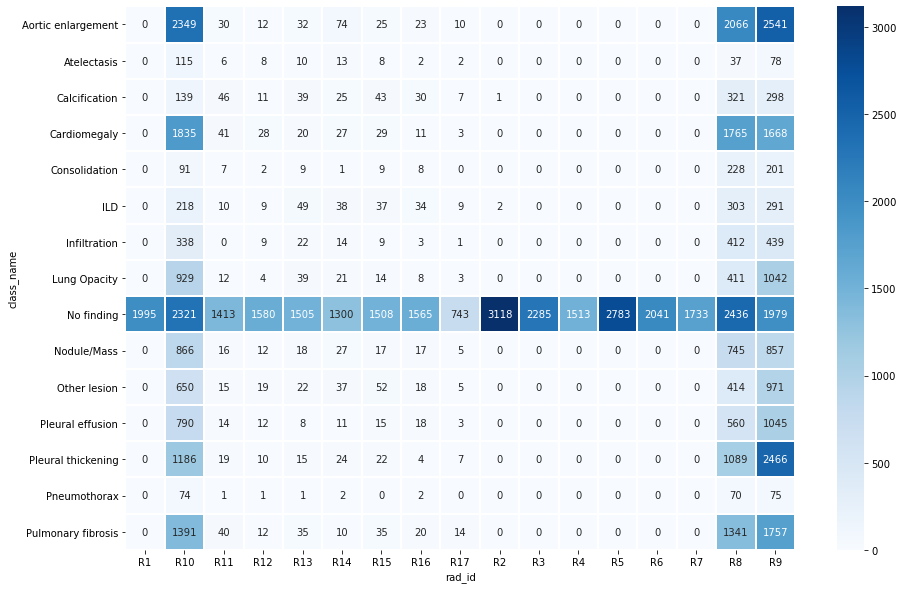

In [9]:
class_each_rad = pd.pivot_table(train_df, columns='rad_id', index='class_name',
                                values='image_id', aggfunc='count', fill_value=0)
plt.subplots(figsize=(15, 10))
sns.heatmap(class_each_rad, annot=True, linewidths=1, cmap='Blues', fmt='g')
plt.show()

# R8, R9, R10 is largest
# R1, R3, R4, R5, R6, R7 only normal case

In [10]:
# display_image(train_df, train_list, is_dicom_file=False)

In [11]:
%%time

train_normal = train_df[train_df['class_name']=='No finding'].reset_index(drop=True)
train_normal['x_min_resize'] = 0
train_normal['y_min_resize'] = 0
train_normal['x_max_resize'] = 1
train_normal['y_max_resize'] = 1

train_abnormal = train_df[train_df['class_name']!='No finding'].reset_index(drop=True)
train_abnormal[['x_min_resize', 'y_min_resize', 'x_max_resize', 'y_max_resize']] = train_abnormal \
.apply(lambda x: label_resize(x[['h', 'w']].values, IMG_SIZE, *x[['x_min', 'y_min', 'x_max', 'y_max']].values),
       axis=1, result_type="expand")
train_abnormal['x_center'] = 0.5*(train_abnormal['x_min_resize'] + train_abnormal['x_max_resize'])
train_abnormal['y_center'] = 0.5*(train_abnormal['y_min_resize'] + train_abnormal['y_max_resize'])
train_abnormal['width'] = train_abnormal['x_max_resize'] - train_abnormal['x_min_resize']
train_abnormal['height'] = train_abnormal['y_max_resize'] - train_abnormal['y_min_resize']
train_abnormal['area'] = train_abnormal.apply(lambda x: (x['x_max_resize']-x['x_min_resize'])*(x['y_max_resize']-x['y_min_resize']), axis=1)
train_abnormal = train_abnormal[~train_abnormal.index.isin(list_remove)].reset_index(drop=True)

train_abnormal.tail()

CPU times: user 31.9 s, sys: 90.6 ms, total: 32 s
Wall time: 32 s


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,h,w,x_min_resize,y_min_resize,x_max_resize,y_max_resize,x_center,y_center,width,height,area
35894,b53d1dd80e99ca6bcef9d592f65d3321,Pleural effusion,10,R9,240.0,1550.0,562.0,2001.0,2880,2304,53,276,125,356,89.0,316.0,72,80,5760
35895,26d1d5a0ef2e692c6340e74859ffdc53,Pulmonary fibrosis,13,R10,1163.0,787.0,1338.0,941.0,3072,3072,194,131,223,157,208.5,144.0,29,26,754
35896,22672ab82c290c20b86863291e25ef6c,ILD,5,R9,299.0,664.0,794.0,1508.0,2500,2048,75,136,198,309,136.5,222.5,123,173,21279
35897,db169d0be36123bd55b866d6aa73983b,Other lesion,9,R8,6.0,670.0,272.0,1736.0,2880,2304,1,119,60,309,30.5,214.0,59,190,11210
35898,4b56bc6d22b192f075f13231419dfcc8,Cardiomegaly,3,R8,771.0,979.0,1680.0,1311.0,2040,1968,201,246,437,329,319.0,287.5,236,83,19588


# Change wbf

In [12]:
def Preprocess_wbf(df, size=SIZE, iou_thr=0.5, skip_box_thr=0.0001):
    list_image = []
    list_boxes = []
    list_cls = []
    list_h, list_w = [], []
    new_df = pd.DataFrame()
    for image_id in tqdm(df['image_id'].unique(), leave=False):
        image_df = df[df['image_id']==image_id].reset_index(drop=True)
        h, w = image_df.loc[0, ['h', 'w']].values
        boxes = image_df[['x_min_resize', 'y_min_resize',
                          'x_max_resize', 'y_max_resize']].values.tolist()
        boxes = [[j/(size-1) for j in i] for i in boxes]
        scores = [1.0]*len(boxes)
        labels = [float(i) for i in image_df['class_id'].values]
        boxes, scores, labels = weighted_boxes_fusion([boxes], [scores], [labels],
                                                      weights=None,
                                                      iou_thr=iou_thr,
                                                      skip_box_thr=skip_box_thr)
        list_image.extend([image_id]*len(boxes))
        list_h.extend([h]*len(boxes))
        list_w.extend([w]*len(boxes))
        list_boxes.extend(boxes)
        list_cls.extend(labels.tolist())
    list_boxes = [[int(j*(size-1)) for j in i] for i in list_boxes]
    new_df['image_id'] = list_image
    new_df['class_id'] = list_cls
    new_df['h'] = list_h
    new_df['w'] = list_w
    new_df['x_min_resize'], new_df['y_min_resize'], \
    new_df['x_max_resize'], new_df['y_max_resize'] = np.transpose(list_boxes)
    new_df['x_center'] = 0.5*(new_df['x_min_resize'] + new_df['x_max_resize'])
    new_df['y_center'] = 0.5*(new_df['y_min_resize'] + new_df['y_max_resize'])
    new_df['width'] = new_df['x_max_resize'] - new_df['x_min_resize']
    new_df['height'] = new_df['y_max_resize'] - new_df['y_min_resize']
    new_df['area'] = new_df.apply(lambda x: (x['x_max_resize']-x['x_min_resize'])\
                                  *(x['y_max_resize']-x['y_min_resize']), axis=1)
    return new_df

# train_abnormal = Preprocess_wbf(train_abnormal)
# train_abnormal.tail()

# Fold

In [13]:
def split_df(df):
    kf = MultilabelStratifiedKFold(n_splits=GlobalConfig.fold_num, shuffle=True, random_state=GlobalConfig.seed)
    df['id'] = df.index
    annot_pivot = pd.pivot_table(df, index=['image_id'], columns=['class_id'],
                                 values='id', fill_value=0, aggfunc='count') \
    .reset_index().rename_axis(None, axis=1)
    for fold, (train_idx, val_idx) in enumerate(kf.split(annot_pivot,
                                                         annot_pivot.iloc[:, 1:(1+df['class_id'].nunique())])):
        annot_pivot[f'fold_{fold}'] = 0
        annot_pivot.loc[val_idx, f'fold_{fold}'] = 1
    return annot_pivot

size_df = pd.read_csv(TRAIN_META_PATH)
size_df.columns = ['image_id', 'h', 'w']

fold_csv = split_df(train_abnormal)
fold_csv = fold_csv.merge(size_df, on='image_id', how='left')
fold_csv.head(10)

,image_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,fold_0,fold_1,fold_2,fold_3,fold_4,h,w
0,0005e8e3701dfb1dd93d53e2ff537b6e,0,0,0,0,1,0,1,2,1,0,0,0,0,0,0,0,0,1,0,3072,3072
1,0007d316f756b3fa0baea2ff514ce945,2,0,0,1,0,2,0,0,0,0,0,3,0,3,0,0,1,0,0,2880,2304
2,000d68e42b71d3eac10ccc077aba07c1,1,0,0,0,0,0,0,1,0,8,0,2,0,1,0,0,0,0,1,2880,2304
3,00150343289f317a0ad5629d5b7d9ef9,3,0,0,1,0,0,0,2,0,1,4,4,0,2,0,0,0,0,1,2508,2525
4,001d127bad87592efe45a5c7678f8b8d,0,0,1,0,0,0,0,0,0,0,0,0,0,5,0,0,1,0,0,3072,3072
5,0046f681f078851293c4e710c4466058,1,0,0,0,0,0,1,0,0,0,0,2,0,7,0,0,0,1,0,2880,2304
6,0061cf6d35e253b6e7f03940592cc35e,1,0,3,0,0,0,0,0,1,0,0,0,0,2,0,0,0,0,1,3072,2540
7,00675cd546313f912cadd4ad54415d69,3,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2992,2606
8,008b3176a7248a0a189b5731ac8d2e95,0,0,0,1,0,0,0,3,6,2,0,0,0,0,0,0,0,0,1,3147,2505
9,009d4c31ebf87e51c5c8c160a4bd8006,1,0,0,0,1,0,0,3,0,0,3,0,0,1,0,0,0,0,1,2890,2762


# Create Dataset

In [14]:
def create_file(df, split_df, train_file, train_folder, fold):
    
    os.makedirs(f'{train_file}/labels/train/', exist_ok=True)
    os.makedirs(f'{train_file}/images/train/', exist_ok=True)
    os.makedirs(f'{train_file}/labels/val/', exist_ok=True)
    os.makedirs(f'{train_file}/images/val/', exist_ok=True)
    
    list_image_train = split_df[split_df[f'fold_{fold}']==0]['image_id']    
    train_df = df[df['image_id'].isin(list_image_train)].reset_index(drop=True)
    val_df = df[~df['image_id'].isin(list_image_train)].reset_index(drop=True)
    
    for train_img in tqdm(train_df.image_id.unique()):
        with open(f'{train_file}/labels/train/{train_img}.txt', 'w+') as f:
            row = train_df[train_df['image_id']==train_img]\
            [['class_id', 'x_center', 'y_center', 'width', 'height']].values
            row[:, 1:] /= SIZE
            row = row.astype('str')
            for box in range(len(row)):
                text = ' '.join(row[box])
                f.write(text)
                f.write('\n')
        sh.copy(f'{train_folder}/{train_img}.png', 
                f'{train_file}/images/train/{train_img}.png')
        
    for val_img in tqdm(val_df.image_id.unique()):
        with open(f'{train_file}/labels/val/{val_img}.txt', 'w+') as f:
            row = val_df[val_df['image_id']==val_img]\
            [['class_id', 'x_center', 'y_center', 'width', 'height']].values
            row[:, 1:] /= SIZE
            row = row.astype('str')
            for box in range(len(row)):
                text = ' '.join(row[box])
                f.write(text)
                f.write('\n')
        sh.copy(f'{train_folder}/{val_img}.png', 
                f'{train_file}/images/val/{val_img}.png')
        
# create_file(train_abnormal, fold_csv, './chest_yolo', TRAIN_512_PATH, 0)
# gc.collect()

In [15]:
# !python ./yolov5/train.py --epochs 60 --batch-size 4 --cfg ./chest_yaml/yolov5x.yaml \
# --data ./chest_yaml/chest.yaml --weights ./chest_yaml/yolov5x.pt --img 512 --device 0

In [16]:
# result = '../working/runs/train/exp/'
# for img in os.listdir(result):
#     if 'png' in img or 'jpg' in img:
#         display(Image(filename=f'{result}/{img}', width=900))

# Model predict

In [17]:
%%time

size_df = pd.read_csv(TEST_META_PATH)
size_df.columns = ['image_id', 'h', 'w']

sub_df = pd.read_csv(SUB_PATH)
sub_df = sub_df.merge(size_df, on='image_id', how='left')
sub_df.head()

CPU times: user 13.3 ms, sys: 0 ns, total: 13.3 ms
Wall time: 35.6 ms


,image_id,PredictionString,h,w
0,002a34c58c5b758217ed1f584ccbcfe9,14 1 0 0 1 1,2584,2345
1,004f33259ee4aef671c2b95d54e4be68,14 1 0 0 1 1,3028,2517
2,008bdde2af2462e86fd373a445d0f4cd,14 1 0 0 1 1,2880,2304
3,009bc039326338823ca3aa84381f17f1,14 1 0 0 1 1,2430,1994
4,00a2145de1886cb9eb88869c85d74080,14 1 0 0 1 1,2408,2136


In [18]:
!python ../input/yolov5/yolov5/detect.py --weights ../input/yolov5-train/runs/train/exp/weights/best.pt \
--img-size 512 --conf-thres 0.005 --source ../input/vinbigdata/test/ --iou-thres 0.45 \
--save-txt --save-conf

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.005, device='', exist_ok=False, img_size=512, iou_thres=0.45, name='exp', project='runs/detect', save_conf=True, save_txt=True, source='../input/vinbigdata/test/', update=False, view_img=False, weights=['../input/yolov5-train/runs/train/exp/weights/best.pt'])
Fusing layers... 
image 1/3000 /kaggle/working/../input/vinbigdata/test/002a34c58c5b758217ed1f584ccbcfe9.png: 512x512 1 Aortic enlargement, 1 Cardiomegaly, 1 ILD, 1 Infiltration, 1 Lung Opacity, 2 Nodule/Masss, 1 Other lesion, 5 Pleural thickenings, 1 Pulmonary fibrosis, Done. (1.324s)
image 2/3000 /kaggle/working/../input/vinbigdata/test/004f33259ee4aef671c2b95d54e4be68.png: 512x512 1 Aortic enlargement, 1 Pleural thickening, Done. (1.235s)
image 3/3000 /kaggle/working/../input/vinbigdata/test/008bdde2af2462e86fd373a445d0f4cd.png: 512x512 1 Aortic enlargement, 1 Cardiomegaly, 2 Pleural thickenings, 1 Pulmonary fibrosis, Done. (1.220s)
image 4/3000 /kaggle/wor

In [19]:
def aug(file):
    if file=='train':
        return al.Compose([
            al.VerticalFlip(p=0.5),
            al.HorizontalFlip(p=0.5),
            al.RandomRotate90(p=0.5),
            al.OneOf([
                al.GaussNoise(0.002, p=0.5),
                al.IAAAffine(p=0.5),
            ], p=0.2),
            al.OneOf([
                al.Blur(blur_limit=(3, 10), p=0.4),
                al.MedianBlur(blur_limit=3, p=0.3),
                al.MotionBlur(p=0.3)
            ], p=0.3),
            al.OneOf([
                al.RandomBrightness(p=0.3),
                al.RandomContrast(p=0.4),
                al.RandomGamma(p=0.3)
            ], p=0.5),
            al.Cutout(num_holes=20, max_h_size=20, max_w_size=20, p=0.5),
#             al.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, p=0.3),
            al.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), p=1),
            ToTensorV2(p=1)
        ])

    elif file=='validation':
        return al.Compose([
            al.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), p=1),
            ToTensorV2(p=1)
        ])

    elif file=='test':
        return al.Compose([
            al.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), p=1),
            ToTensorV2(p=1)
        ], p=1)

In [20]:
class EfficientnetCus(nn.Module):
    
    def __init__(self, model, num_class, model_weight=None, is_train=True):
        super(EfficientnetCus, self).__init__()
        
        self.is_train = is_train
        self.model = timm.create_model(f'tf_efficientnet_{model}_ns', pretrained=is_train,
                                       in_chans=3, num_classes=num_class)
        if model_weight is not None:
            new_keys = self.model.state_dict().keys()
            values = torch.load(model_weight, map_location=lambda storage, loc: storage).values()
            self.model.load_state_dict(OrderedDict(zip(new_keys, values)))
                
    def forward(self, image):
        if self.is_train:
            out = self.model(image)
            return out.squeeze(-1)
        else:
            vertical = image.flip(1)
            horizontal = image.flip(2)
            rotate90 = torch.rot90(image, 1, (1, 2))
            rotate90_ = torch.rot90(image, 1, (2, 1))
            out = torch.stack([image, vertical, horizontal, rotate90, rotate90_])
            return torch.sigmoid(self.model(out)).mean()

In [21]:
class Predict_process(object):
    def __init__(self, device=device, config=PredictConfig):
        super(Predict_process, self).__init__()
        self.device = device
        self.config = config
        
    def load_image(self, image_path, transforms):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = transforms(image=image)['image']
        return image
        
    def classifier_image(self, images):
        model = EfficientnetCus(model=self.config.model_classifier_use, num_class=1,
                                model_weight=self.config.weight_classifier, is_train=False).to(self.device)
        model.eval()
        with torch.no_grad():
            outputs = model(images.to(device))
        return outputs
    
    def label_process(self, detect_result, iou_thresh, iou_thresh11):
        assert detect_result != ''
        x_center, y_center = detect_result[1::6], detect_result[2::6]
        w_center, h_center = detect_result[3::6], detect_result[4::6]
        detect_result[1::6] = [i-0.5*j for i, j in zip(x_center, w_center)]
        detect_result[2::6] = [i-0.5*j for i, j in zip(y_center, h_center)]
        detect_result[3::6] = [i+0.5*j for i, j in zip(x_center, w_center)]
        detect_result[4::6] = [i+0.5*j for i, j in zip(y_center, h_center)]
        list_new = []
        
        for label_values in np.unique(detect_result[::6]):
            list_values = np.array([detect_result[6*idx:6*idx+6] \
                                    for idx, i in enumerate(detect_result[::6]) if i==label_values])
            boxes = list_values[:, 1:5].tolist()
            scores = list_values[:, 5].tolist()
            labels = list_values[:, 0].tolist()
            if label_values in [2, 11]:
                boxes, scores, labels = nms([boxes], [scores], [labels], weights=None, iou_thr=iou_thresh11)
            else:
                boxes, scores, labels = nms([boxes], [scores], [labels], weights=None, iou_thr=iou_thresh)
            
            for box in list_values:
                if box[-1] in scores:
                    list_new.extend(box)
        return list_new
        
    def read_label(self, label_path):
        with open(label_path, 'r+') as file:
            detect_result = file.read()
        if detect_result != '':
            detect_result = list(map(float, re.split(r'[\n ]', detect_result)[:-1]))
            detect_result = self.label_process(detect_result, self.config.iou_thresh, self.config.iou_thresh11)
            detect_result = [int(i) if idx%6==0 else self.config.img_size[0]*i if idx%6<5 else i 
                             for idx, i in enumerate(detect_result)]
        return detect_result
        
    def fit(self, df, folder_image, result_txt, use_classifier=True):
        transforms = aug('test')
        all_results = []
        for images_id, images in tqdm(df.iterrows(), total=len(df), leave=False):
            if use_classifier:
                image_path = os.path.join(folder_image, images.image_id+'.png')
                image = self.load_image(image_path, transforms)
                class_labels = self.classifier_image(image)
            else:
                class_labels = torch.tensor([1])
            label_path = os.path.join(result_txt, images.image_id+'.txt')
            if os.path.isfile(label_path):
                detect_result = self.read_label(label_path)
            else:
                detect_result = ''
            result_one_image = []
            if detect_result != '':
                img_size = [images.h, images.w]
                list_label = []
                for box_id in range(len(detect_result)//6)[::-1]:
                    label, *box, score = detect_result[6*box_id:6*box_id+6]
                    if class_labels.item()>=self.config.classification_thresh:
                        if (score > self.config.score_last) and \
                        not(label in [0, 3] and label in list_label) and \
                        not(label==11 and score < self.config.score_11) and \
                        not(label==9 and score < self.config.score_9):
                            list_label.append(label)
                            box = label_resize(self.config.img_size, img_size, *box)
                            result_one_image.append(int(label))
                            result_one_image.append(np.round(score, 3))
                            result_one_image.extend([int(i) for i in box])
                    else:
                        if score > self.config.score_last2 and \
                        not(label in [0, 3] and label in list_label) and \
                        not(label==11 and score < self.config.score_11) and \
                        not(label==9 and score < self.config.score_9):
                            list_label.append(label)
                            box = label_resize(self.config.img_size, img_size, *box)
                            result_one_image.append(int(label))
                            result_one_image.append(np.round(score, 3))
                            result_one_image.extend([int(i) for i in box])
            if len(result_one_image)==0:
                all_results.append('14 1 0 0 1 1')
            else:
                result_str = ' '.join(map(str, result_one_image)) + \
                f' 14 {class_labels.item():.3f} 0 0 1 1'
                all_results.append(result_str)
        df['PredictionString'] = all_results
        df = df.drop(['h', 'w'], 1)
        
        return df

    
predict_pr = Predict_process(config=PredictConfig)
submission_df = predict_pr.fit(sub_df, TEST_512_PATH, '../working/runs/detect/exp/labels/')
submission_df.to_csv('submission.csv', index=False)
submission_df.head(60)

  0%|          | 0/3000 [00:00<?, ?it/s]

Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 2 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates > 1. Check that your boxes was normalized at [0, 1]
Warning. Fixed 1 boxes coordinates > 1. Check that your boxes was normalized at [0, 1]
Warning. Fixed 1 boxes coordinates > 1. Check that your boxes was normalized at [0, 1]
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates > 1. Check that your boxes was normalized at [0, 1]
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates < 0
Warning. Fixed 1 boxes coordinates > 1. Check that your boxes was normalized at [0, 1]
Warning. Fixed 1 bo

,image_id,PredictionString
0,002a34c58c5b758217ed1f584ccbcfe9,14 1 0 0 1 1
1,004f33259ee4aef671c2b95d54e4be68,11 0.097 1406 302 1701 367 0 0.838 1254 585 15...
2,008bdde2af2462e86fd373a445d0f4cd,13 0.009 734 1097 833 1198 11 0.05 1589 439 18...
3,009bc039326338823ca3aa84381f17f1,14 1 0 0 1 1
4,00a2145de1886cb9eb88869c85d74080,13 0.064 555 1289 809 1406 3 0.854 776 1270 18...
5,00b7e6bfa4dc1fe9ddd0ce74743e38c2,13 0.011 838 943 973 1049 13 0.01 814 721 1119...
6,011295e0bcdc7636569ab73bfdcc4450,14 1 0 0 1 1
7,013c169f9dad6f1f6485da961b9f7bf2,13 0.44 639 681 931 1119 13 0.011 1455 593 160...
8,01431a2618c0ace741e4e270a37e20b9,3 0.829 1048 1440 2034 1766 0 0.776 1377 810 1...
9,0168eb925aa6f28a78b16134792f5d0e,14 1 0 0 1 1


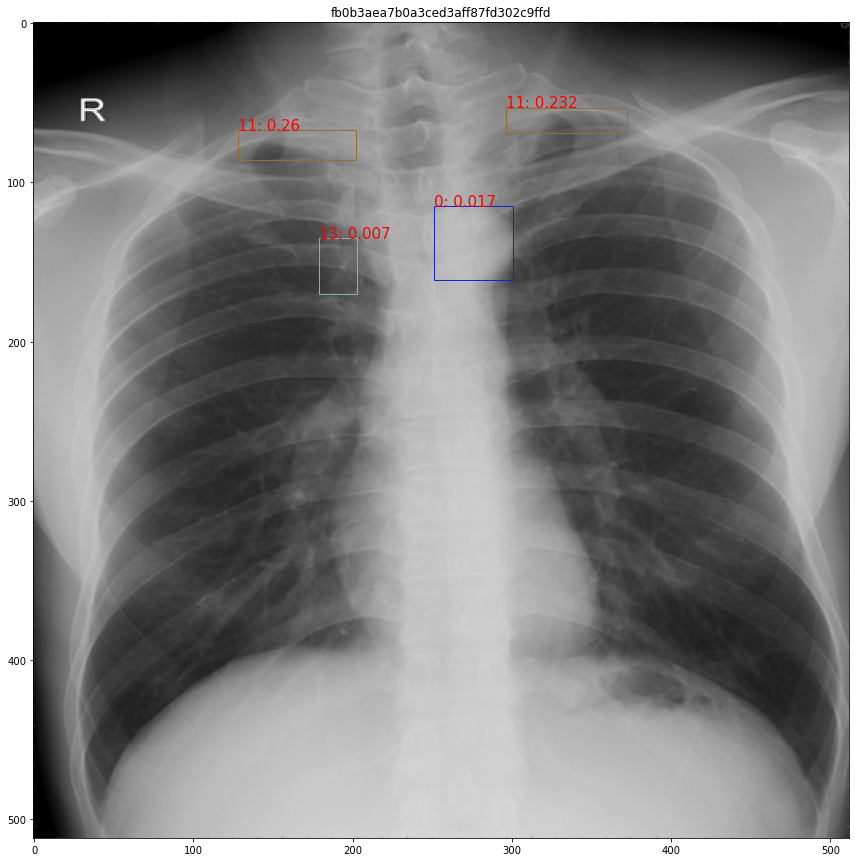

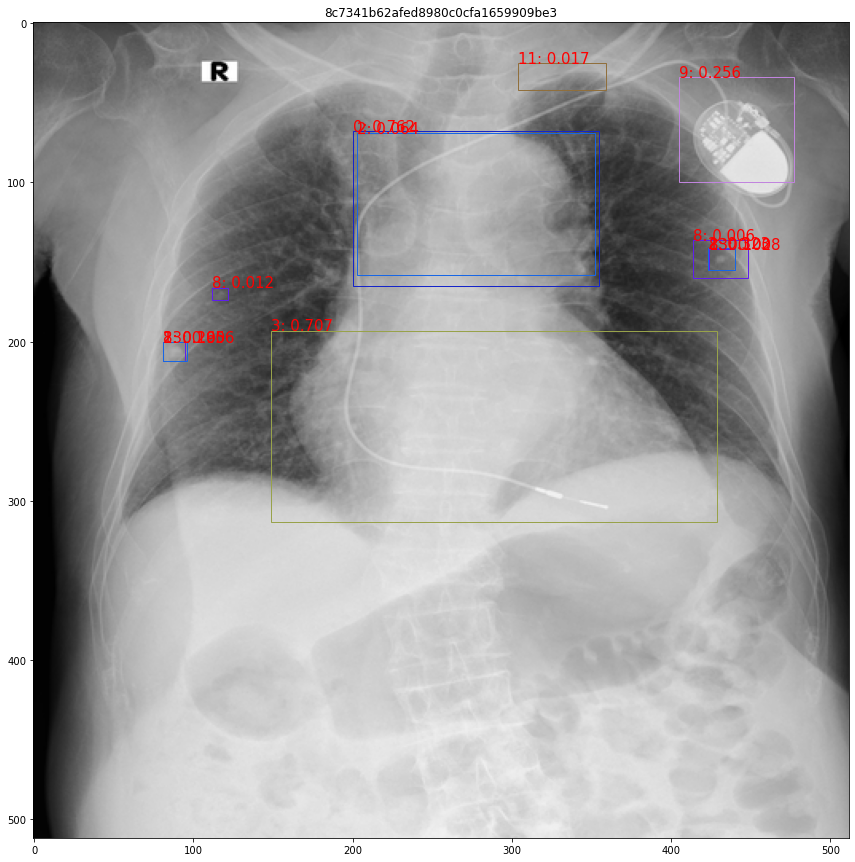

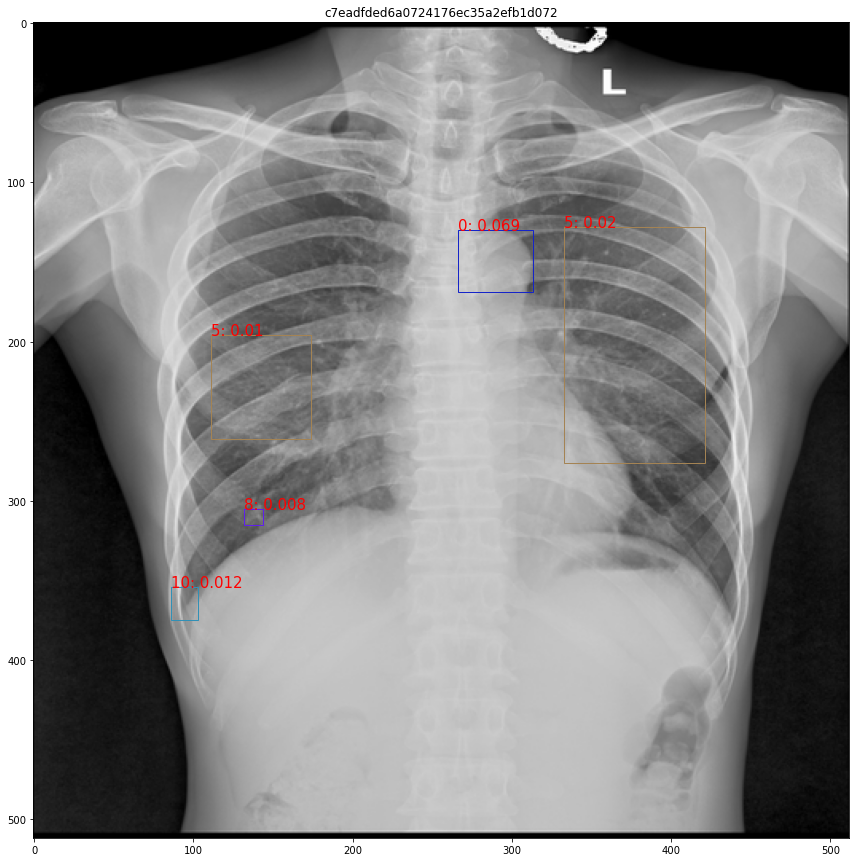

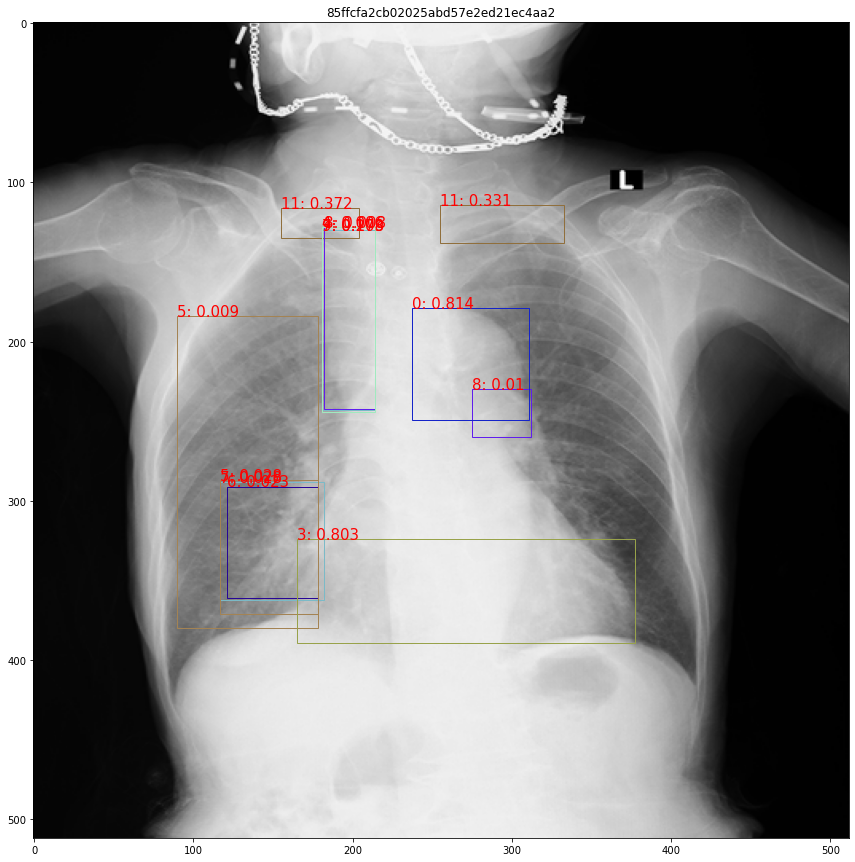

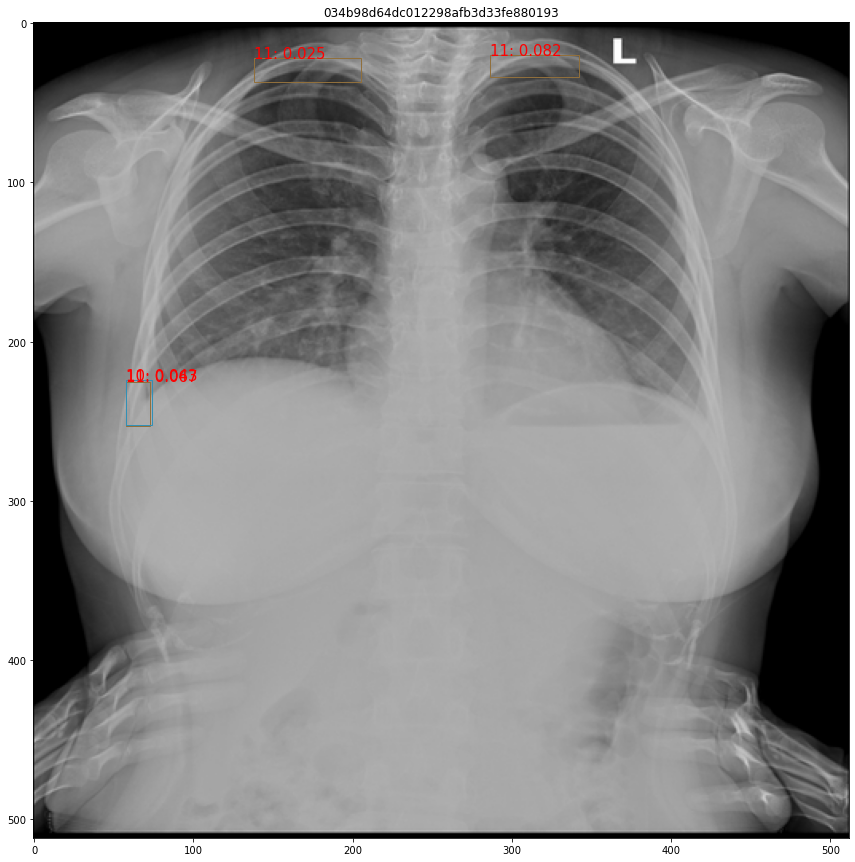

...

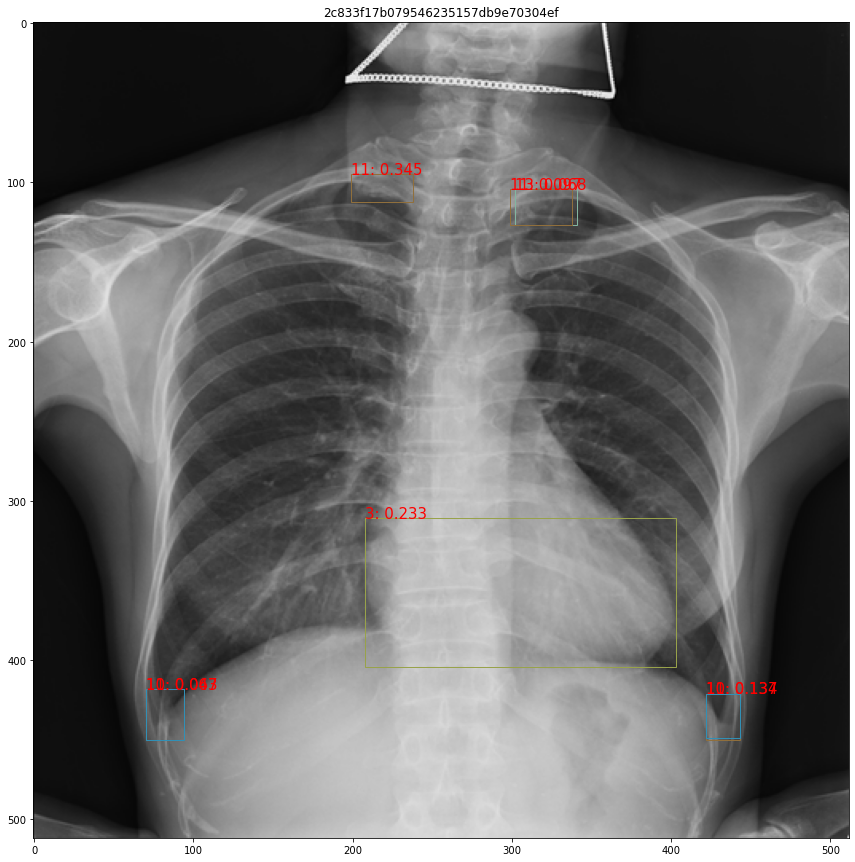

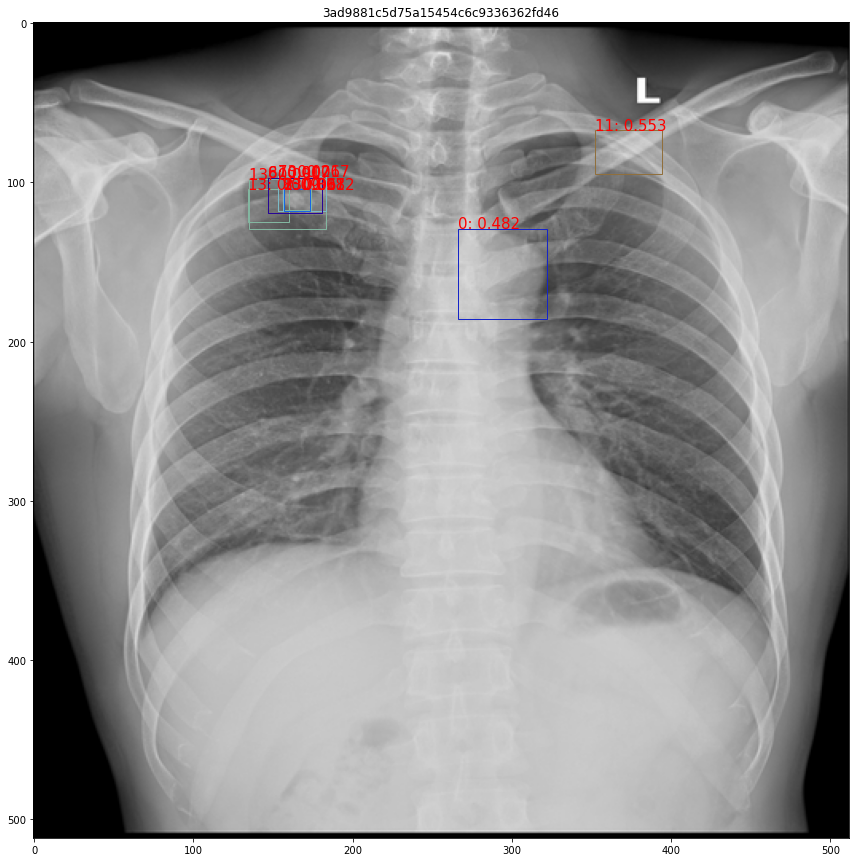

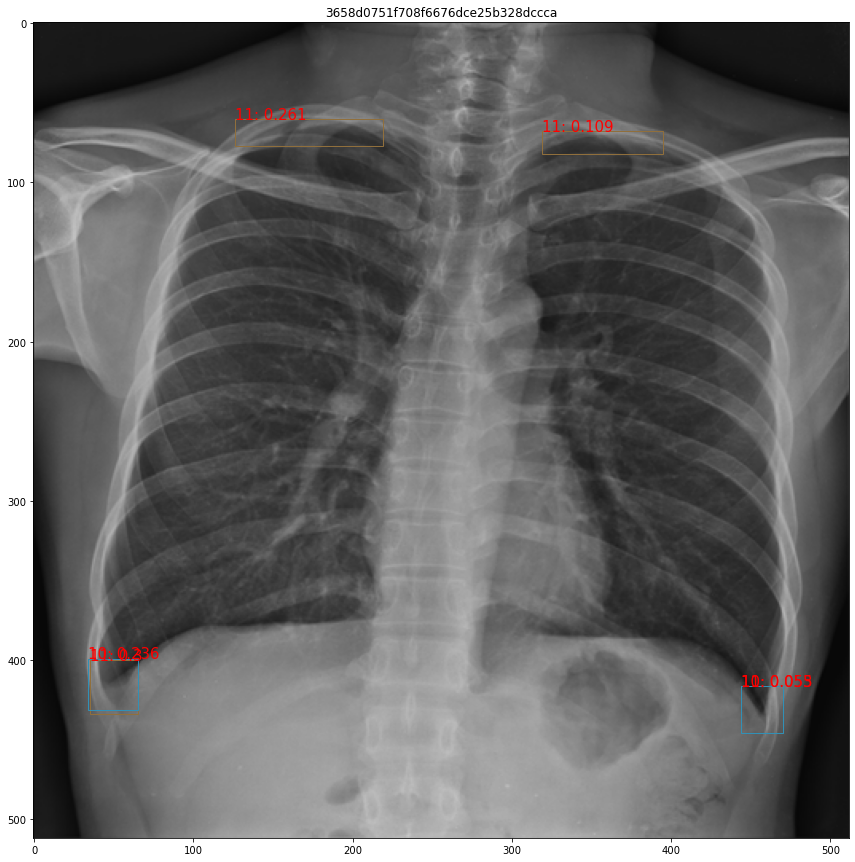

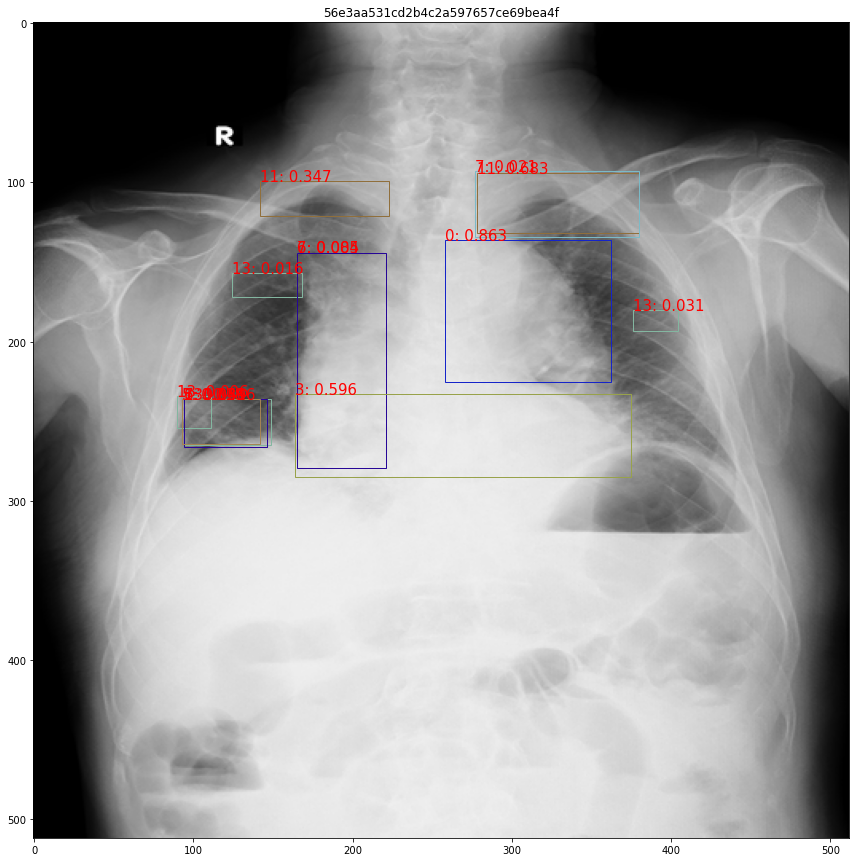

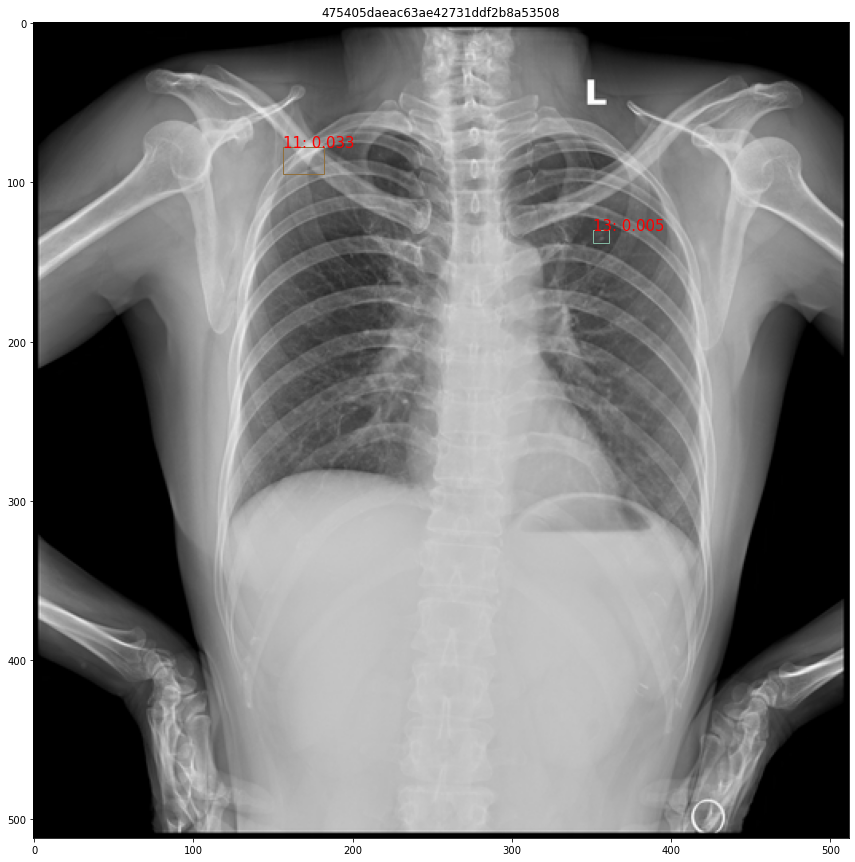

In [22]:
def display_image_test(df, size_df, list_image, num_image=3):
    
    dict_color = list_color(range(15))
    image_row_random = np.random.choice(len(df), num_image, replace=(len(df)<num_image))
    for image_idx in image_row_random:
        image_id, pred = df.loc[image_idx, 'image_id'], df.loc[image_idx, 'PredictionString']
        org_size = size_df[size_df['image_id']==image_id][['h', 'w']].values[0].tolist()
        fig, ax = plt.subplots(1, figsize=(15, 15))
        img_path = [i for i in list_image if image_id in i][0]
        img = cv2.imread(img_path)
        ax.imshow(img, plt.cm.bone)
        if pred != '14 1 0 0 1 1':
            list_pred = pred.split(' ')
            for box_idx in range(len(list_pred)//6)[:-1]:
                bbox = map(int, list_pred[6*box_idx+2:6*box_idx+6])
                x_min, y_min, x_max, y_max = label_resize(org_size, IMG_SIZE, *bbox)
                class_name, score = int(list_pred[6*box_idx]), float(list_pred[6*box_idx+1])
                rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min,
                                         linewidth=1, edgecolor=dict_color[class_name], facecolor='none')
                ax.add_patch(rect)
                plt.text(x_min, y_min, f'{class_name}: {score}', fontsize=15, color='red')            

        plt.title(image_id) 
        plt.show()

size_df = pd.read_csv(TEST_META_PATH)
size_df.columns = ['image_id', 'h', 'w']

image_abnormal = submission_df[submission_df['PredictionString']!='14 1 0 0 1 1'].reset_index(drop=True)
display_image_test(image_abnormal, size_df, test_list, num_image=20)

In [23]:
!rm -rf ../working/runs